## Installation

In [ ]:
!pip install --upgrade langchain_google_vertexai unstructured unstructured-inference langchain-community langchain_google_community opencv-python==4.9.0.80 google-cloud-vision

In [ ]:
!pip install --upgrade pillow pdfminer.six pdf2image unstructured_pytesseract

In [ ]:
!apt-get install -y poppler-utils libleptonica-dev tesseract-ocr libtesseract-dev python3-pil tesseract-ocr-eng tesseract-ocr-script-latn

!bash /Applications/Python\ 3.11/Install\ Certificates.command
!brew install tesseract

## Multimodal Gemini

In [1]:
from langchain_google_vertexai import ChatVertexAI
from langchain_core.messages import HumanMessage


In [4]:
chat_vision_model = ChatVertexAI(model_name="gemini-2.0-flash-exp")

In [6]:

question1 = HumanMessage(content="Hello. Who are you?")
answer1 = chat_vision_model.invoke([question1])
print(answer1.content)

question2 = HumanMessage(content="What kind of input and output do you support")
answer2 = chat_vision_model.invoke([question1, answer1, question2])

I am a large language model, trained by Google.



In [12]:
from IPython.display import Markdown

display(Markdown(answer2.content))


I primarily work with **text input** and generate **text output**. Here's a more detailed breakdown:

**Input:**

*   **Text:** I can process a wide variety of textual input, including:
    *   Questions (simple, complex, factual, creative)
    *   Statements
    *   Instructions
    *   Prompts for creative writing
    *   Code snippets (in various programming languages)
    *   Data in textual formats (like CSV, JSON)
    *   Conversational turns
    *   Summaries of documents
    *   Transcripts of audio or video
    *   And more!
*   **Context:** I can also consider prior text in a conversation to maintain context and provide relevant responses.
*   **Language:** I support a wide range of languages, although my performance may vary.
*   **Formatting:** I can understand basic formatting like lists, paragraphs, and headings.

**Output:**

*   **Text:** My primary output is text. This can include:
    *   Answers to questions
    *   Explanations and summaries
    *   Creative text formats (poems, code, scripts, musical pieces, email, letters, etc.)
    *   Translations between languages
    *   Code generation
    *   Text that continues or completes a given prompt
    *   Conversational responses
    *   And more!
*   **Formatting:** I can generate formatted text, like bulleted lists, paragraphs, code blocks, tables, etc.
*   **Language:** I output text in the language you used in your input, or as instructed.
*   **Tone and Style:** I can be guided to output text with different tones and styles (formal, informal, humorous, technical, etc.)

**Things I *Don't* Support Directly:**

*   **Visual Input:** I can't directly process images or videos.
*   **Auditory Input:** I can't directly process sounds or speech. (Though I can process text transcripts of audio.)
*   **Physical Interaction:** I am a software program and do not have a physical body. I cannot interact with the physical world.

**In Summary:**

My strength lies in understanding and generating human-like text. I can analyze and synthesize information, create original text, translate, and engage in conversations. Think of me as a highly sophisticated text processing and generation tool.


"I primarily work with **text input** and generate **text output**. Here's a more detailed breakdown:\n\n**Input:**\n\n*   **Text:** I can process a wide variety of textual input, including:\n    *   Questions (simple, complex, factual, creative)\n    *   Statements\n    *   Instructions\n    *   Prompts for creative writing\n    *   Code snippets (in various programming languages)\n    *   Data in textual formats (like CSV, JSON)\n    *   Conversational turns\n    *   Summaries of documents\n    *   Transcripts of audio or video\n    *   And more!\n*   **Context:** I can also consider prior text in a conversation to maintain context and provide relevant responses.\n*   **Language:** I support a wide range of languages, although my performance may vary.\n*   **Formatting:** I can understand basic formatting like lists, paragraphs, and headings.\n\n**Output:**\n\n*   **Text:** My primary output is text. This can include:\n    *   Answers to questions\n    *   Explanations and summaries\

In [13]:
image_url = "gs://cloud-samples-data/vision/label/wakeupcat.jpg"
image_message_part = {
    "type": "image_url",
    "image_url": {"url": image_url}
}

output = chat_vision_model.invoke([HumanMessage(content=["What is shown in this image?", image_message_part])])
print(output.content)

The image shows an orange cat with a heart-shaped tag on its collar, yawning with its mouth wide open. The cat is positioned in the center of the frame and in front of a window with closed blinds and a cat tree. Behind the cat, there is a doorway and a brown shelf with items on it. The text overlay on the bottom of the image says "Wake up human!"


As a reminder, so far it's the same functionality you can achieve with Gemini. Let's compare:

In [16]:
llm = ChatVertexAI(model_name="gemini-2.0-flash-exp")
audio_uri = "gs://cloud-samples-data/generative-ai/audio/audio_summary_clean_energy.mp3"
audio_message_part = {
    "type": "media",
    "file_uri": audio_uri,
    "mime_type": "audio/mp3",
}
# text_message_part = {"type": "text", "text": "Describe the attached media in 5 words!"}
result =  llm.invoke([HumanMessage(content=[
                                        audio_message_part, 
                                        "Describe the attached media in 10 words!"
                                        ]
                                )])
print(result.content)

Google uses geothermal energy to power data centers.


## Imagen

### Image captioning

First, let's try ImageGen model for image captioning - we'll ask the model to describe the content of the image with human language.

Let's look at a random public image:

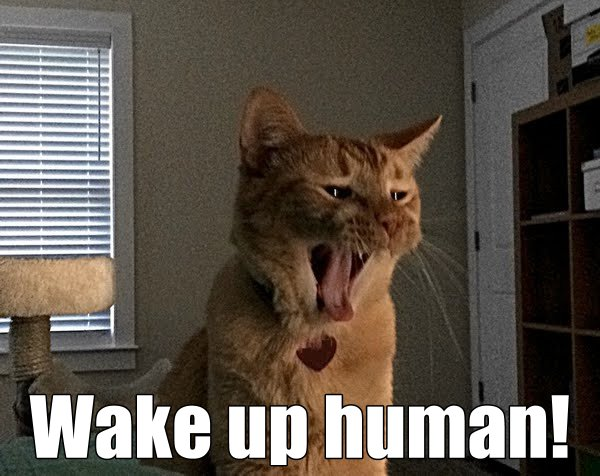

In [17]:
from langchain_google_vertexai._image_utils import ImageBytesLoader
from vertexai.vision_models import Image

image_loader = ImageBytesLoader()
image = image_loader.load_bytes(image_url)
Image(image).show()

And ask Imagen to describe it:

In [18]:
from langchain_google_vertexai import VertexAIImageCaptioning, VertexAIImageCaptioningChat

model_ic = VertexAIImageCaptioning()
response = model_ic.invoke(image_url)
print(response)

a cat yawning with the caption wake up human


In [ ]:
cap_msg = HumanMessage(content=[
                    image_message_part, 
                    "Generate a caption for this image!"
                    ]
            )
result =  llm.invoke([cap_msg])
display(Markdown(result.content))

Certainly! Here are a few options for captions for the image:

**General/Humorous:**

* "When your alarm clock is a demanding ginger cat."
* "The only acceptable way to wake up your human."
* "I'm not yelling, you're just sleeping too much!"
* "The struggle is real... for both of us."
* "Rise and shine, it's breakfast time!"

**Descriptive:**

* "An orange cat yawning and demanding attention."
* "A tired-looking cat giving a big yawn with a 'Wake up human' caption."
* "Close-up of an orange cat in mid-yawn with a humorous caption."

**Short and Sweet:**

* "Wake up call!"
* "Morning mood."
* "Cat's orders."

If you have any specific type of caption you'd like, just let me know!

Now let's ask some questions about the image. Please, note that despite the interface looks similar to chat models, it only allows a single-turn chat:

In [19]:
from langchain_google_vertexai import VertexAIVisualQnAChat
model_qa = VertexAIVisualQnAChat()

message_qa = HumanMessage(content=[image_message_part, "What is shown in this image?"])
answer = model_qa.invoke([message_qa])
print(answer.content)

message_qa1 = HumanMessage(content=[image_message_part, "What is the cat doing?"])
answer1 = model_qa.invoke([message_qa1])
print(answer1.content)

cat
yawning


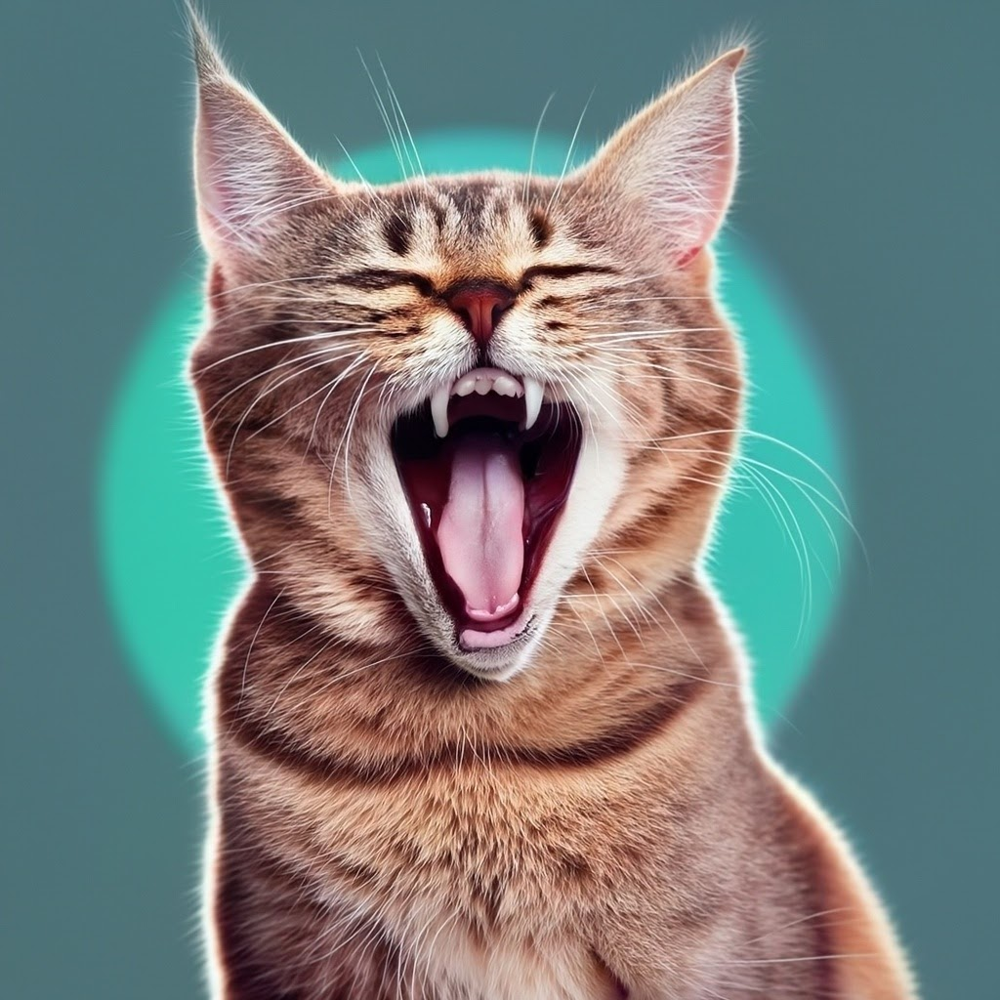

In [20]:
from langchain_google_vertexai import VertexAIImageGeneratorChat
model_generate = VertexAIImageGeneratorChat()

message_gen = HumanMessage(content=["Generate an image with a yawning cat."])
answer = model_generate.invoke([message_gen])
image_loader = ImageBytesLoader()
image = image_loader.load_bytes(answer.content[0]["image_url"]["url"])
Image(image).show()

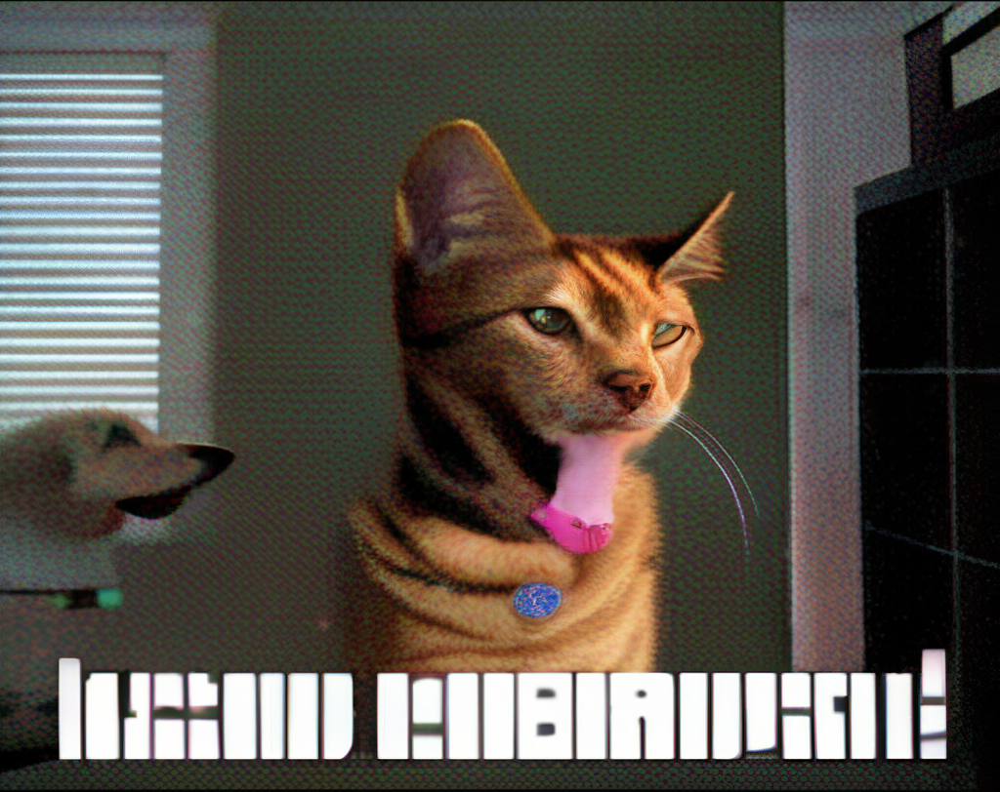

In [22]:
from langchain_google_vertexai import VertexAIImageEditorChat
model_edit = VertexAIImageEditorChat()

message_edit = HumanMessage(content=[image_message_part, "Replace a cat with a dog."])
answer = model_edit.invoke([message_edit])
image_loader = ImageBytesLoader()
image = image_loader.load_bytes(answer.content[0]["image_url"]["url"])
Image(image).show()

## Parse pdfs

In [32]:
PROJECT="genai-app-bldr"
BUCKET=f"{PROJECT}-genai-on-gcp-lc"
REGION="asia-northeast3"

In [29]:
from unstructured.partition.pdf import partition_pdf

/Users/jeffz/projects/Generative-AI-on-Google-Cloud-with-LangChain/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Let's copy the report we'd like to parse:

In [33]:
!gsutil -m cp ./alphabet-2023-annual-report.pdf gs://{BUCKET}/pdf/alphabet-2023-annual-report.pdf

5696.86s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


If you experience problems with multiprocessing on MacOS, they might be related to https://bugs.python.org/issue33725. You can disable multiprocessing by editing your .boto config or by adding the following flag to your command: `-o "GSUtil:parallel_process_count=1"`. Note that multithreading is still available even if you disable multiprocessing.

Copying file://./alphabet-2023-annual-report.pdf [Content-Type=application/pdf]...
/ [1/1 files][  2.1 MiB/  2.1 MiB] 100% Done                                    
Operation completed over 1 objects/2.1 MiB.                                      


Now let's created a function to parse the pdf with unstructred library and extract all various elements (incl. tables and images) from it:

In [30]:
def load_pdf(file_path: str):
  """Uses Unstructured library to load pdf and extract images."""
  file_name = file_path.split("/")[-1]
  return partition_pdf(
    filename=file_path,
    extract_images_in_pdf=True,
    chunking_strategy="by_title",
    extract_image_block_types=["Image", "Table"],
    extract_image_block_to_payload=False,
    extract_image_block_output_dir=f"./extracted_images/{file_name}"
  )


And let's run it (we need to wait until it finishes, it make take up to 1-2 hours):

In [ ]:
import nltk
nltk.download()

In [31]:
partition = load_pdf("./alphabet-2023-annual-report.pdf")

In [34]:
len(partition)

1040

In [43]:
display(partition)

 ...]

In [36]:
from langchain_google_community import GCSFileLoader
from langchain_community.document_loaders import UnstructuredPDFLoader, PyPDFLoader, UnstructuredImageLoader

GCS_PATH = "pdf/alphabet-2023-annual-report.pdf"
gcs_loader = GCSFileLoader(
    project_name=PROJECT,
    bucket=BUCKET,
    blob=GCS_PATH,
    loader_func=PyPDFLoader
)
annual_report_docs = gcs_loader.load()

In [50]:
print(len(annual_report_docs))
display(annual_report_docs)

108


[Document(metadata={'source': 'gs://genai-app-bldr-genai-on-gcp-lc/pdf/alphabet-2023-annual-report.pdf', 'page': 0, 'page_label': '1'}, page_content='Alphabet 2023 Annual Report'),
 Document(metadata={'source': 'gs://genai-app-bldr-genai-on-gcp-lc/pdf/alphabet-2023-annual-report.pdf', 'page': 1, 'page_label': '2'}, page_content='Directors\nLarry Page\nCo-Founder\nSergey Brin\nCo-Founder\nSundar Pichai\nChief Executive Officer\nAlphabet and Google \nJohn L. Hennessy\nChair of the Board of Directors\nFormer President\nStanford University\nFrances H. Arnold\nLinus Pauling Professor of \nChemical Engineering, \nBioengineering and Biochemistry\nCalifornia Institute of Technology\nR. Martin “Marty” Chávez\nPartner and Vice Chairman \nSixth Street Partners\nL. John Doerr\nGeneral Partner and Chair\nKleiner Perkins\nRoger W. Ferguson Jr.\nFormer President and \nChief Executive Officer \nTIAA \nK. Ram Shriram\nManaging Partner\nSherpalo Ventures\nRobin L. Washington\nFormer Executive Vice Presi

In [48]:
from langchain_community.document_loaders import UnstructuredPDFLoader, PyPDFLoader, UnstructuredImageLoader

lc_pdf_loader = UnstructuredPDFLoader("./alphabet-2023-annual-report.pdf", mode="paged")
annual_report_docs_by_lc_loader = lc_pdf_loader.load()

`mode='paged'` is deprecated in favor of the 'by_page' chunking strategy. Learn more about chunking here: https://docs.unstructured.io/open-source/core-functionality/chunking


In [49]:
print(len(annual_report_docs_by_lc_loader))
display(annual_report_docs_by_lc_loader)

108


[Document(metadata={'source': './alphabet-2023-annual-report.pdf', 'coordinates': {'points': ((1764.0, 224.0), (1764.0, 567.0), (1788.0, 567.0), (1788.0, 224.0)), 'system': 'PixelSpace', 'layout_width': 3554, 'layout_height': 2350}, 'filetype': 'application/pdf', 'languages': ['eng'], 'last_modified': '2025-01-27T16:04:09', 'page_number': 1, 'file_directory': '.', 'filename': 'alphabet-2023-annual-report.pdf'}, page_content='Y co) me) © << 2 <\n\nAlphabet 2023 Annual Report\n\n'),
 Document(metadata={'source': './alphabet-2023-annual-report.pdf', 'coordinates': {'points': ((2905.0, 1649.0), (2905.0, 1738.0), (3170.0, 1738.0), (3170.0, 1649.0)), 'system': 'PixelSpace', 'layout_width': 3554, 'layout_height': 2350}, 'filetype': 'application/pdf', 'languages': ['eng'], 'last_modified': '2025-01-27T16:04:09', 'page_number': 2, 'file_directory': '.', 'filename': 'alphabet-2023-annual-report.pdf', 'parent_id': '83a845d50d9c926ebb55cc5bac4d4605'}, page_content='Larry Page Co-Founder\n\nSergey 

Now let's go through all extracted elements, take only tables and create a separate collection of LangChain documents:

In [44]:
from unstructured.documents.elements import CompositeElement, Table
from langchain_core.documents import Document

file_path = "./alphabet-2023-annual-report.pdf"

documents = []
elements = partition

prev_doc, prev_table = None, None

for i, element in enumerate(elements):
  if isinstance(element, CompositeElement):
    if prev_table:
      documents.append(prev_table)
      prev_table = None
    if not prev_doc:
      prev_doc = Document(page_content=element.text, metadata={"source": file_path, "page": element.metadata.page_number, "element": "text"})
    else:
      if prev_doc.metadata["page"] == element.metadata.page_number:
        prev_doc.page_content += element.text
      else:
        documents.append(prev_doc)
        prev_doc = Document(page_content=element.text, metadata={"source": file_path, "page": element.metadata.page_number, "element": "text"})
  if isinstance(element, Table):
    if prev_doc:
      documents.append(prev_doc)
      prev_doc = None
    if element.metadata.is_continuation:
      prev_table.page_content += element.text
    else:
      if prev_table:
        documents.append(prev_table)
      prev_table = Document(page_content=element.text, metadata={"source": file_path, "page": element.metadata.page_number, "element": "table"})

if prev_table:
  documents.append(prev_table)
if prev_doc:
  documents.append(prev_doc)

In [45]:
len(documents)

162

In [46]:
display(documents)

[Document(metadata={'source': './alphabet-2023-annual-report.pdf', 'page': 1, 'element': 'text'}, page_content='<\n\nco) © 2 Alphabet 2023 Annual Report\n\n<<\n\nme)\n\nY\n\nLarry Page Co-Founder\n\nSundar Pichai Chief Executive Officer Alphabet and Google\n\nSergey Brin Co-Founder\n\nSundar Pichai Chief Executive Officer Alphabet and Google\n\nRuth M. Porat President and Chief Investment Officer; Chief Financial Officer Alphabet and Google\n\nJohn L. Hennessy Chair of the Board of Directors Former President Stanford University\n\nPrabhakar Raghavan Senior Vice President Knowledge and Information Google'),
 Document(metadata={'source': './alphabet-2023-annual-report.pdf', 'page': 2, 'element': 'text'}, page_content='Frances H. Arnold Linus Pauling Professor of Chemical Engineering, Bioengineering and Biochemistry California Institute of Technology\n\nR. Martin “Marty” Chavez Partner and Vice Chairman Sixth Street Partners\n\nPhilipp Schindler Senior Vice President Chief Business Office

We can now save these documents to a folder:

In [19]:
!mkdir documents

In [20]:
import json

for i, d in enumerate(documents):
  with open(f"./documents/document_{i}.json", "w") as f:
    json.dump(d.to_json(), f)

And if needed, that's how we deserialize them back from the folder:

In [ ]:
import os
import json
from langchain_core.load import loads

documents = []
folder_path = "./documents"
for path in os.listdir(folder_path):
  full_path = os.path.join(folder_path, path)
  with open(full_path, 'r') as f:
    document = json.load(f)
    documents.append(loads(json.dumps(document)))

And we can also copy extracted images to the GCS bucket so that we can easier pass a link to an image to the model later

## Build RAG

## Create index

Let's create three vector indices - one only for texts, one for texts + text description of images, and the last one for images only:

In [39]:
!gsutil mb -l {REGION} gs://{BUCKET} 


!gsutil -m cp -R extracted_images gs://{BUCKET}/langchain/chapter8/example1/

3113.90s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


Creating gs://genai-app-bldr-genai-on-gcp-lc/...


3121.13s - pydevd: Sending message related to process being replaced timed-out after 5 seconds


If you experience problems with multiprocessing on MacOS, they might be related to https://bugs.python.org/issue33725. You can disable multiprocessing by editing your .boto config or by adding the following flag to your command: `-o "GSUtil:parallel_process_count=1"`. Note that multithreading is still available even if you disable multiprocessing.

Copying file://extracted_images/alphabet-2023-annual-report.pdf/table-59-22.jpg [Content-Type=image/jpeg]...
Copying file://extracted_images/alphabet-2023-annual-report.pdf/table-93-65.jpg [Content-Type=image/jpeg]...
Copying file://extracted_images/alphabet-2023-annual-report.pdf/table-91-60.jpg [Content-Type=image/jpeg]...
Copying file://extracted_images/alphabet-2023-annual-report.pdf/table-91-61.jpg [Content-Type=image/jpeg]...
Copying file://extracted_images/alphabet-2023-annual-report.pdf/table-78-38.jpg [Content-Type=image/jpeg]...
Copying file://extracted_images/alphabet-2023-annual-report.pdf/table-93-64.jpg [Content-Type=image/jpeg

In [51]:
display_names = [
    "multimodal_example_lc_texts",
    "multimodal_example_lc_texts_images",
    "multimodal_example_lc_images3"
    ]
descriptions = [
    "Chapter 8 LangChain on Google Cloud",
    "Chapter 8 LangChain on Google Cloud (text + images)",
    "Chapter 8 LangChain on Google Cloud (image only)"
    ]
dimensions = [768, 768, 1408]

In [24]:
from google.cloud import aiplatform

indices = []

for name, description, dim in zip(display_names, descriptions, dimensions):
  index = aiplatform.MatchingEngineIndex.create_tree_ah_index(
      display_name=name,
      dimensions=dim,
      approximate_neighbors_count=150,
      leaf_node_embedding_count=500,
      leaf_nodes_to_search_percent=7,
      index_update_method="STREAM_UPDATE",
      description=description,
      location=REGION
  )
  indices.append(index)

index_raw, index_mixed, index_images = indices

Creating MatchingEngineIndex
Create MatchingEngineIndex backing LRO: projects/314325024630/locations/asia-northeast3/indexes/1803146292994506752/operations/6035686067548454912
MatchingEngineIndex created. Resource name: projects/314325024630/locations/asia-northeast3/indexes/1803146292994506752
To use this MatchingEngineIndex in another session:
index = aiplatform.MatchingEngineIndex('projects/314325024630/locations/asia-northeast3/indexes/1803146292994506752')
Creating MatchingEngineIndex
Create MatchingEngineIndex backing LRO: projects/314325024630/locations/asia-northeast3/indexes/3911956818510741504/operations/7584924339363905536
MatchingEngineIndex created. Resource name: projects/314325024630/locations/asia-northeast3/indexes/3911956818510741504
To use this MatchingEngineIndex in another session:
index = aiplatform.MatchingEngineIndex('projects/314325024630/locations/asia-northeast3/indexes/3911956818510741504')
Creating MatchingEngineIndex
Create MatchingEngineIndex backing LRO:

We also need to create an index endpoint:

In [25]:
index_endpoint = aiplatform.MatchingEngineIndexEndpoint.create(
    display_name="multimodal_example_endpoint",
    description="Chapter 8 LangChain on Google Cloud Endpoint",
    public_endpoint_enabled=True,
    project=PROJECT,
    location=REGION
)

Creating MatchingEngineIndexEndpoint
Create MatchingEngineIndexEndpoint backing LRO: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824/operations/1306906458809434112
MatchingEngineIndexEndpoint created. Resource name: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824
To use this MatchingEngineIndexEndpoint in another session:
index_endpoint = aiplatform.MatchingEngineIndexEndpoint('projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824')


And deploy our indices to this endpoint:

In [41]:
for index in indices:
  _ = index_endpoint.deploy_index(
    index=index, deployed_index_id=index.display_name
    )

Deploying index MatchingEngineIndexEndpoint index_endpoint: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824
Deploy index MatchingEngineIndexEndpoint index_endpoint backing LRO: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824/operations/129215156252049408
MatchingEngineIndexEndpoint index_endpoint Deployed index. Resource name: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824
Deploying index MatchingEngineIndexEndpoint index_endpoint: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824
Deploy index MatchingEngineIndexEndpoint index_endpoint backing LRO: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824/operations/6393722237924409344
MatchingEngineIndexEndpoint index_endpoint Deployed index. Resource name: projects/314325024630/locations/asia-northeast3/indexEndpoints/783098569581133824
Deploying index MatchingEngineIndexEndpoi

In [52]:
endpoint_id = "783098569581133824" # index_endpoint.name
raw_index_id = "1803146292994506752" # indices[0].name
mixed_index_id = "3911956818510741504" # indices[1].name
image_index_id = "1439480623084339200" # indices[2].name

In [53]:
print(raw_index_id)

1803146292994506752


### Initial RAG

Define some variables here:

In [54]:
project = "genai-app-bldr"
location = "asia-northeast3"
bucket_name = f"{project}-genai-on-gcp-lc"
# GCS path where we copied extracted images
prefix = "langchain/chapter8/example1/extracted_images/alphabet-2023-annual-report.pdf"

In [55]:
from langchain_google_vertexai import VectorSearchVectorStore
from langchain_google_vertexai import VertexAIEmbeddings

vectorstore_raw = VectorSearchVectorStore.from_components(
    project_id=project,
    region=location,
    gcs_bucket_name=bucket_name,
    index_id=raw_index_id,
    endpoint_id=endpoint_id,
    embedding=VertexAIEmbeddings(model_name="textembedding-gecko@003"),
    stream_update=True
)

In [56]:
vectorstore_mixed = VectorSearchVectorStore.from_components(
    project_id=project,
    region=location,
    gcs_bucket_name=bucket_name,
    index_id=mixed_index_id,
    endpoint_id=endpoint_id,
    embedding=VertexAIEmbeddings(model_name="textembedding-gecko@003"),
    stream_update=True
)

Add documents to the vectorstore

In [57]:
vectorstore_raw.add_documents(annual_report_docs)


Upserting datapoints MatchingEngineIndex index: projects/314325024630/locations/asia-northeast3/indexes/1803146292994506752
MatchingEngineIndex index Upserted datapoints. Resource name: projects/314325024630/locations/asia-northeast3/indexes/1803146292994506752


['3ec8c83f-851d-44a1-bab3-7605244fca59',
 '840460d5-4f99-4b9b-af4e-890be1a0127f',
 '06ca0c52-83f2-43fa-9b61-912ef9083864',
 '5b899c43-e7db-410a-8060-06d3574e43da',
 'e9f5a5bb-abf5-4518-b576-88a2635cf43a',
 'a2a7f2b2-4c30-454c-9bec-97db336f949b',
 'd3d7b6f1-11a0-4597-9e03-c85b23a6a2b7',
 '32d784b2-bdfb-4b6c-87f5-6ea2fb42aae5',
 '864765bb-34cc-44ee-83e4-74cf20183102',
 '506e5ece-fee5-4d34-8858-9a54a5fa5615',
 '3d799d40-961d-419e-8f8a-690fc9a55822',
 '0bbb66ff-1988-4fc0-ae77-4ce95d3ab5e2',
 '8a2faae1-d5c2-40ab-a134-6123efc9c1a5',
 '99315367-780e-438f-b9bd-84ba73665105',
 '4a535582-373e-481e-b288-f56e92f53ae6',
 'f4a2cb3d-3783-496f-8686-7df01770fdce',
 '4990cbdf-68a7-4c4f-9e9a-d674916cc8e3',
 '224e0f7f-d2f3-439d-8654-88ae3487432a',
 'ee1d832e-c7be-4f66-93bc-0d328c651c53',
 '98f5ef3a-ce93-42da-a7e9-88001087e6a3',
 '05fee98c-506d-4690-bd84-ceecffb4cc05',
 'f71118f3-e96b-4f79-9251-ac805aaadaaf',
 '6c4dbafa-264d-49c7-b1a5-a19987289f2c',
 '2ab9ed25-6de9-4655-a465-5c775639e341',
 'b73e85db-7bfb-

In [58]:
vectorstore_mixed.add_documents(annual_report_docs)

Upserting datapoints MatchingEngineIndex index: projects/314325024630/locations/asia-northeast3/indexes/3911956818510741504
MatchingEngineIndex index Upserted datapoints. Resource name: projects/314325024630/locations/asia-northeast3/indexes/3911956818510741504


['f5bb0d83-7e1e-4ef6-8d69-e0947bf2fe83',
 '9251ebf0-3670-4cc7-baa0-e77d91db33f8',
 'adeac3b1-50c6-4dd6-9506-f9f5b97d3865',
 'e3f55f98-28a8-4376-b84b-834d6a378036',
 '1a14c7ef-54c4-4636-af50-adee415b1b60',
 '1f40843c-c6f2-4c14-bf51-797bfa6e4eb0',
 'b56b4614-9c13-4d19-8664-2ebcadba6780',
 '6c776c9f-15d1-4175-aa45-78b62233fe7e',
 '3d93e5a8-7bf4-4e17-a59f-2f09b175a8f0',
 '1631ffa6-3ebb-4b95-92e4-e44ac3650c3e',
 '89b275a9-3f20-41eb-a1c9-baf7a23892a6',
 '10b496c9-de9a-442c-88e5-6db72a237779',
 '17351bcb-efd0-48de-b800-eaf5a54d8348',
 '657d18f9-0b75-4221-9c6a-e91b94ec7e3f',
 'bd854e08-771d-4162-ac7e-75b0173c632b',
 '45cc92e4-e4f4-434a-912b-23ac34c3ce8a',
 '9404c156-b3e8-4d83-9cbe-fb324fcbcbc3',
 '99aeda6f-1271-48c0-8875-19fda9f9fb3c',
 'd4775479-af79-4516-8cf2-628df3e3f72a',
 '3bd4f57e-69b3-4abf-982e-3d07d3a37d75',
 '9c58c1a1-46fd-47a2-a08c-ab235ffdaa6c',
 'a4d5e3d0-2173-4c0e-8946-7df3e144ccf9',
 '824863b4-5595-4ad8-b5ee-c6387ea83847',
 '07f88862-c4b5-4f2a-9a19-3c3507f83eb1',
 'cf3bf506-5cf2-

Now, let's create a simple RAG:

In [62]:
from langchain.prompts import PromptTemplate
from langchain_core.runnables import RunnablePassthrough

from langchain_google_vertexai import ChatVertexAI
from langchain_core.output_parsers import StrOutputParser


prompt = PromptTemplate(
    input_variables=["question", "context"],
    template="Answer the question\n{question}\ngiven the following context:\n{context}\n.",
)

retriever_raw = vectorstore_raw.as_retriever(search_kwargs={"k": 10})

def format_docs(docs):
  return "\n".join(f'page: {doc.metadata.get("page", 0)}\n{doc.page_content}' for doc in docs)

chain_rag = (
    {
        "context": retriever_raw | format_docs,
        "question": RunnablePassthrough(),
    }
    | prompt
    | ChatVertexAI(
        temperature=0, model_name="gemini-2.0-flash-exp", location="us-central1", max_output_tokens=1024)
    | StrOutputParser()
)

And test it on a few questions:

In [63]:
chain_rag.invoke("What was Alphabet's revenue in 2022?")

"Alphabet's revenue in 2022 was $282,836 million.\n"

In [64]:
chain_rag.invoke("What was Alphabet's revenue in 2023?")

"Alphabet's revenue in 2023 was $307,394 million.\n"

In [66]:
chain_rag.invoke("How many startups were supported by the Sustainable Development program in 2023?")

"I'm sorry, but the provided document does not contain information about the number of startups supported by the Sustainable Development program in 2023. Therefore, I cannot answer your question.\n"

In [69]:
chain_rag.invoke("How many public views did Youtube have in 2023?")

'The provided document does not contain the total number of public views YouTube had in 2023. It only provides revenue information related to YouTube ads and subscriptions.\n'

As we can see, it can answer all questions but the one which answer is "hidden" in the image.

### Multimodal RAG option 1

Let's create a function that uses a LLM to give a textual description of an image:

In [70]:
def describe_image(llm: ChatVertexAI, image_path: str) -> str:
  """Describes an image with a multimodal LLM."""
  text_message = {
        "type": "text",
        "text": (
            "Your task is to summarize images for retrieval."
            "These summaries will be embedded and used to retrieve "
            "the image that is relevant for the query."
            "Give a concise summary of the image and optimize it "
            "for retrieval.\nIf it's a table, extract all its elements."
            "\nIf it's a graph or a chart, explain the findings in the "
            "graph. Do not include any numbers that are not mentioned in the "
            "image."
        )
  }
  image_message = {
        "type": "image_url",
        "image_url": {"url": image_path},
    }
  message = HumanMessage(content=[text_message, image_message])
  return llm.invoke([message]).content

Let's test it out:

In [71]:
path_example = f"{prefix}/figure-35-4.jpg"

'The image is a line graph showing the trends of four different lines. The red line starts at around $100, goes up to around $300, then goes down to around $200, and then goes up again. The light red line starts at around $100, goes up to around $250, then goes down to around $180, and then goes up again. The black line starts at around $100, goes up to around $200, then goes down to around $120, and then goes up again. The grey line starts at around $100, goes up to around $200, then goes down to around $150, and then goes up again.'

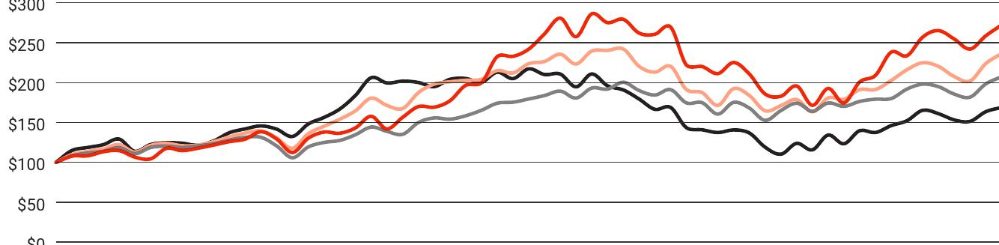

In [75]:
llm_mm = ChatVertexAI(model_name="gemini-2.0-flash-exp", temperature=0.4, location="us-central1")
img_path = f"gs://{bucket_name}/{path_example}"
display(describe_image(llm_mm, img_path))
Image(ImageBytesLoader().load_bytes(img_path)).show()

Now let's generate description for all the collected images:

In [ ]:
from google.cloud import storage
from langchain_core.documents import Document

storage_client = storage.Client()
bucket = storage_client.bucket(bucket_name)

blobs = bucket.list_blobs(prefix=prefix)

image_docs = []

for blob in blobs:
    full_path = f"gs://{blob.bucket.name}/{blob.name}"
    print(full_path)
    description = describe_image(llm_mm, full_path)
    image_docs.append(Document(
        page_content=description,
        metadata={"source": full_path, "element": "image"}
    ))

And add these generated document to the vectorstore (on top of allready added text documents):

In [77]:
len(image_docs)

81

In [82]:
display(image_docs)

[Document(metadata={'source': 'gs://genai-app-bldr-genai-on-gcp-lc/langchain/chapter8/example1/extracted_images/alphabet-2023-annual-report.pdf/figure-1-1.jpg', 'element': 'image'}, page_content='The image is the cover of the Alphabet 2023 Annual Report. The number 2023 is displayed prominently in white against a red background. The text "Alphabet 2023 Annual Report" is written in a smaller font on the left side of the image. The word "Alphabet" is written in a smaller font on the right side of the image.'),
 Document(metadata={'source': 'gs://genai-app-bldr-genai-on-gcp-lc/langchain/chapter8/example1/extracted_images/alphabet-2023-annual-report.pdf/figure-108-6.jpg', 'element': 'image'}, page_content='The image is a cover page for the Alphabet 2023 Annual Report. The number 2023 is prominently displayed in large white font on a red background. The text "Alphabet 2023 Annual Report" is visible in a smaller font in the upper left corner, and the word "Alphabet" is in the upper right cor

In [78]:
_ = vectorstore_mixed.add_documents(image_docs)

Upserting datapoints MatchingEngineIndex index: projects/314325024630/locations/asia-northeast3/indexes/3911956818510741504
MatchingEngineIndex index Upserted datapoints. Resource name: projects/314325024630/locations/asia-northeast3/indexes/3911956818510741504


In [79]:
retriever_mixed = vectorstore_mixed.as_retriever(search_kwargs={"k": 10})


chain_rag_example1 = (
    {
        "context": retriever_mixed | format_docs,
        "question": RunnablePassthrough(),
    }
    | prompt
    | ChatVertexAI(
        temperature=0, model_name="gemini-2.0-flash-exp", location="us-central1", max_output_tokens=1024)
    | StrOutputParser()
)

In [81]:
chain_rag_example1.invoke("How many public short views did Youtube have in 2023?")

'The provided document does not contain the number of public short views on YouTube in 2023. It does provide the revenue generated by YouTube ads, which was $31,510 million in 2023. However, view counts are not provided.\n'

### Multimodal RAG option 2

We are not going to change anything on the indexing and retrieval part, but let’s pass an image itself instead of its description to the RAG

In [83]:
raw_prompt_template_mm = (
    "Use image or text data or both to answer the question: {question}"
)

def format_mm_docs(docs, question):
  texts = [doc for doc in docs if doc.metadata.get("doc_type") != "image"]
  images = [doc.metadata["source"] for doc in docs if doc.metadata.get("doc_type") == "image"]
  context = "\n".join("page: {0}\n{1}".format(text.metadata.get("page", 0), text.page_content) for text in texts)
  image_messages = []
  for image in images:
    image_message = {
        "type": "image_url",
        "image_url": {"url": image},
    }
    image_messages.append(image_message)
  start_text_message = {
      "type": "text",
      "text": raw_prompt_template_mm.format(question=question),
  }
  text_message = [{
      "type": "text",
      "text": context,
  }] if context else []
  
  return [HumanMessage(content=[start_text_message]+image_messages+text_message)]

In [ ]:
from operator import itemgetter
from langchain_core.runnables import RunnableLambda

chain_rag_example2 = (
    {
        "docs": itemgetter("question") | retriever_mixed,
        "question": RunnablePassthrough()
    }
    | RunnableLambda(lambda x: format_mm_docs(x["docs"], **x["question"]))
    | llm_mm #  ChatVertexAI(temperature=0, model_name="gemini-1.5-pro-001", max_output_tokens=1024)
    | StrOutputParser()
)

In [87]:
chain_rag_example2.invoke(
    {"question": "How much revenue  did Youtube have in 2023?"})

'Based on the provided text, YouTube\'s revenue in 2023 was **$31,510 million** (or $31.51 billion), specifically from YouTube ads.\n\nThis information is found in the "Revenues" section of the provided document, under the "YouTube ads" line item.\n'

### Multimodal RAG option 3

In [88]:
from langchain_google_vertexai import VertexAIEmbeddings

llm_multimodal = VertexAIEmbeddings(model_name="multimodalembedding")

Alternatively, we could have reduced the dimension size of text and image embeddings to a common ground (to 512):

In [89]:
llm1 = VertexAIEmbeddings(model_name="text-embedding-004")
r = llm1.embed(["Hello world"], dimensions=512)
print(len(r[0]))

512


Now let's embedd all images and create LangChain documents:

In [90]:
from uuid import uuid4

blobs = bucket.list_blobs(prefix=prefix)
image_paths = [f"gs://{blob.bucket.name}/{blob.name}" for blob in blobs]
image_embeddings = llm_multimodal.embed_images(image_paths)
documents = [Document(page_content=str(uuid4()), metadata={"source": path, "doc_type": "image"}) for path in image_paths]


In [92]:
from langchain_google_vertexai import VectorSearchVectorStore

vectorstore_images = VectorSearchVectorStore.from_components(
    project_id=project,
    region=location,
    gcs_bucket_name=bucket_name,
    index_id=image_index_id,
    endpoint_id=endpoint_id,
    embedding=VertexAIEmbeddings(model_name="multimodalembedding"),
    stream_update=True
)

Let's add images to the vectorstore (with a bulk insert, and keep in mind that we use a different type of storage in that case):

In [93]:
n = len(image_paths)
ids = vectorstore_images._generate_unique_ids(n)
vectorstore_images._document_storage.mset(list(zip(ids, documents)))

metadatas = [{}] * n

vectorstore_images._searcher.add_to_index(
    ids, image_embeddings, metadatas)

Upserting datapoints MatchingEngineIndex index: projects/314325024630/locations/asia-northeast3/indexes/1439480623084339200
MatchingEngineIndex index Upserted datapoints. Resource name: projects/314325024630/locations/asia-northeast3/indexes/1439480623084339200


Now let's search for the image given the query:

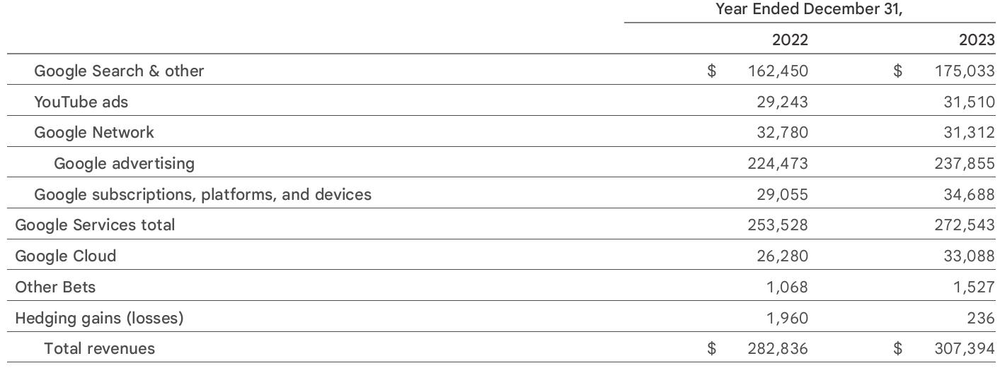

In [94]:
from langchain_google_vertexai._image_utils import ImageBytesLoader
from vertexai.vision_models import Image

results = vectorstore_images.similarity_search("How many users does Youtube have?")
image_loader = ImageBytesLoader()
image = image_loader.load_bytes(results[0].metadata["source"])
Image(image).show()

Now we need to combine an output of two retrievers:

In [95]:
from langchain.retrievers import EnsembleRetriever

retriever_raw = vectorstore_raw.as_retriever(search_kwargs={"k": 2})
retriever_images = vectorstore_images.as_retriever(search_kwargs={"k": 1})

ensemble_retriever = EnsembleRetriever(
    retrievers=[retriever_raw, retriever_images], weights=[0.75, 0.25]
)

In [99]:
from langchain_core.runnables import RunnablePassthrough, RunnableParallel, RunnableLambda
from langchain_text_splitters import RecursiveCharacterTextSplitter

from langchain_google_vertexai import ChatVertexAI
from langchain_core.output_parsers import StrOutputParser
from operator import itemgetter


chain_rag_mm = (
    {
        "docs" : itemgetter("question") | ensemble_retriever, 
        "question" : RunnablePassthrough()
    }
    | RunnableLambda(lambda x: format_mm_docs(x["docs"], **x["question"]))
    | llm_mm # ChatVertexAI(temperature=0.5, model_name="gemini-1.5-pro-001", max_output_tokens=1024)
    | StrOutputParser()
)

In [106]:
result = chain_rag_mm.invoke({"question": "How much revenue did Google Ad have in 2023?"})

In [107]:
print(result)

Based on the provided image, Google advertising revenue in 2023 was $237,855 million.


## Image loader

In [108]:
from langchain_google_community import CloudVisionParser
parser = CloudVisionParser()

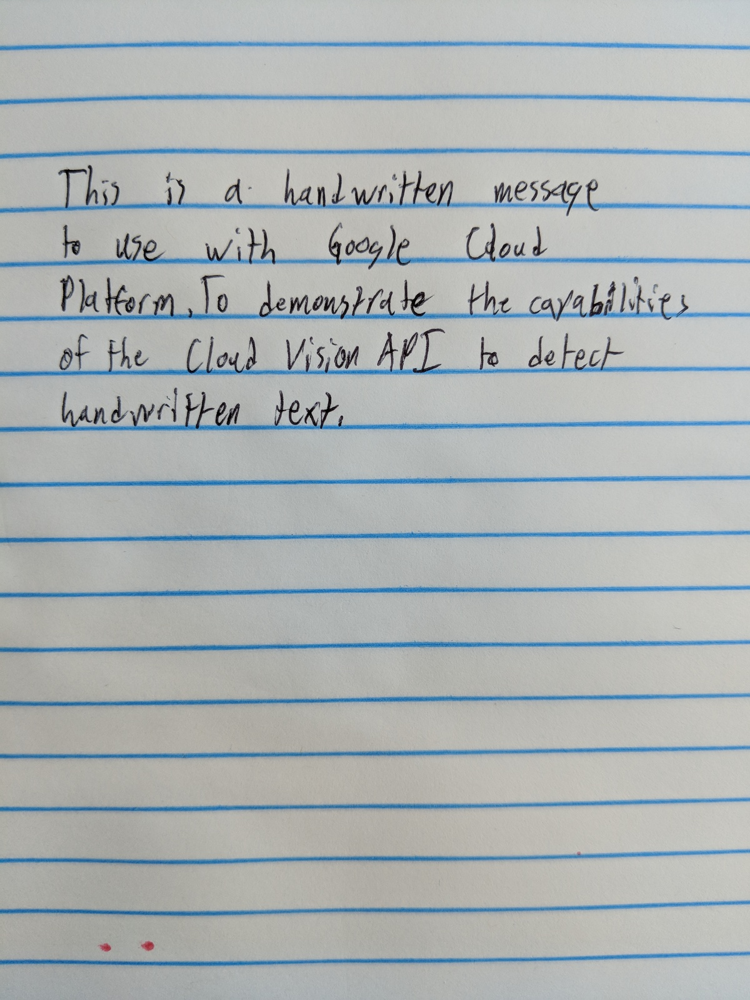

In [109]:
image_url_text = "gs://cloud-samples-data/vision/handwritten.jpg"

image_loader = ImageBytesLoader()
image = image_loader.load_bytes(image_url_text)
Image(image).show()

In [110]:
print(parser.load(image_url_text))


page_content='This is a hand written message
to use with Google Cloud
Platform, To demonstrate the capabilities
of the Cloud Vision API to detect
handwritten text,' metadata={'source': 'gs://cloud-samples-data/vision/handwritten.jpg'}
